In [5]:
import os
import pickle
import config
import dnnlib
import gzip
import json
import numpy as np
from tqdm import tqdm_notebook
import warnings
import matplotlib.pylab as plt
%matplotlib inline
warnings.filterwarnings("ignore")

import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
from encoder.generator_model import Generator

#  Loading data

In [9]:
LATENT_TRAINING_DATA = '/home/anpei/Desktop/stylegan-encoder/cache/latent_training_data.pkl'
tflib.init_tf()
with dnnlib.util.open_url(LATENT_TRAINING_DATA, cache_dir=config.cache_dir) as f:
    qlatent_data, dlatent_data, labels_data = pickle.load(f)

    
  # wow. many fields. amaze

In [10]:
X_data = dlatent_data.reshape((-1, 18 * 512))
y_headPose_data = np.array([x['faceAttributes']['headPose'] for x in labels_data])

assert(len(X_data) == len(y_headPose_data))
print('There are {} data'.format(len(X_data)))

There are 20307 data


# Visualize Data

In [11]:
y_headPose_pitch = [x['pitch'] for x in y_headPose_data]
y_headPose_roll = [x['roll'] for x in y_headPose_data]
y_headPose_yaw = [x['yaw'] for x in y_headPose_data]

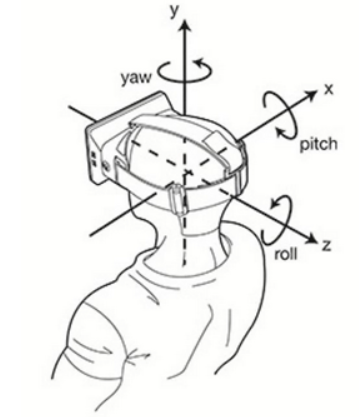

In [13]:
y_smile = [x['faceAttributes']['smile'] for x in labels_data]

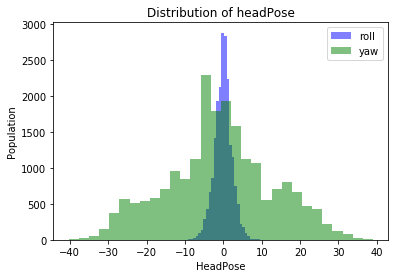

In [12]:
# plt.hist(y_headPose_pitch, bins=30, color='red', alpha=0.5, label='pitch')
plt.hist(y_headPose_roll, bins=30, color='blue', alpha=0.5, label='roll')
plt.hist(y_headPose_yaw, bins=30, color='green', alpha=0.5, label='yaw')
plt.legend()
plt.title('Distribution of headPose')
plt.xlabel('HeadPose')
plt.ylabel('Population')
plt.show()

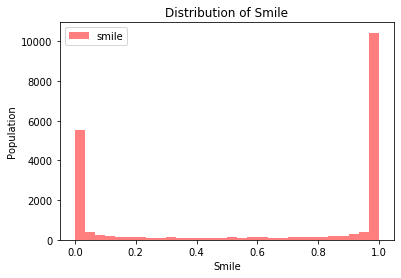

In [23]:
plt.hist(y_smile, bins=30, color='red', alpha=0.5, label='smile')
plt.legend()
plt.title("Distribution of Smile")
plt.xlabel('Smile')
plt.ylabel('Population')
plt.show()

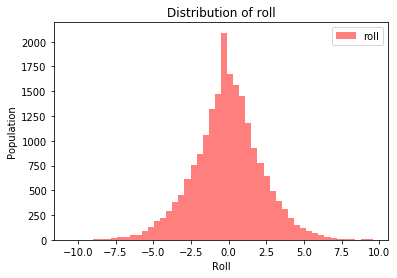

In [32]:
plt.hist(y_headPose_roll, bins=50, color='red', alpha=0.5, label='roll')
plt.legend()
plt.title("Distribution of roll")
plt.xlabel('Roll')
plt.ylabel('Population')
plt.show()

In [6]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import accuracy_score

In [33]:
def binary_map(x):
    if (x >=0):
        return 1
    else:
        return 0
y_binary_yaw = np.array([binary_map(yaw) for yaw in y_headPose_yaw])
y_binary_roll = np.array([binary_map(roll) for roll in y_headPose_roll])

In [9]:
# clf = SGDClassifier('log', class_weight='balanced') # SGB model for performance sake
# scores = cross_val_score(clf, X_data, y_headPose_yaw, scoring='accuracy', cv=5)
# clf.fit(X_data, y_gender_data)
clf = LogisticRegression(class_weight='balanced').fit(X_data, y_binary_yaw)


In [34]:
clf_roll = LogisticRegression(class_weight='balanced').fit(X_data, y_binary_roll)
roll_direction = clf_roll.coef_.reshape((18, 512))

In [12]:
yaw_direction = clf.coef_.reshape((18, 512))
print(clf.predict_proba(X_data))

[[0.32168137 0.67831863]
 [0.84696537 0.15303463]
 [0.41560185 0.58439815]
 ...
 [0.00200607 0.99799393]
 [0.99665134 0.00334866]
 [0.59150306 0.40849694]]


In [11]:
import PIL.Image
import dnnlib.tflib as tflib
from encoder.generator_model import Generator

URL_FFHQ = '/home/anpei/Desktop/stylegan-encoder/cache/karras2019stylegan-ffhq-1024x1024.pkl'

tflib.init_tf()
with dnnlib.util.open_url(URL_FFHQ, cache_dir=config.cache_dir) as f:
    generator_network, discriminator_network, Gs_network = pickle.load(f)

generator = Generator(Gs_network, batch_size=1, randomize_noise=False)
def generate_image(latent_vector):
    latent_vector = latent_vector.reshape((1, 18, 512))
    generator.set_dlatents(latent_vector)
    img_array = generator.generate_images()[0]
    img = PIL.Image.fromarray(img_array, 'RGB')
    return img.resize((256, 256))

def move_and_show(latent_vector, direction, coeffs):
    fig,ax = plt.subplots(1, len(coeffs), figsize=(15, 10), dpi=80)
    for i, coeff in enumerate(coeffs):
        new_latent_vector = latent_vector.copy()
        new_latent_vector[:8] = (latent_vector + coeff*direction)[:8]
        ax[i].imshow(generate_image(new_latent_vector))
        ax[i].set_title('Coeff: %0.1f' % coeff)
    [x.axis('off') for x in ax]
    plt.show()

Instructions for updating:
Colocations handled automatically by placer.


In [25]:
smile_direction = np.load('ffhq_dataset/latent_directions/smile.npy')
muteSmile_direction = yaw_direction - smile_direction

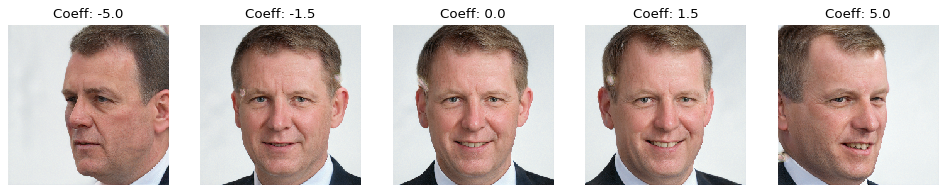

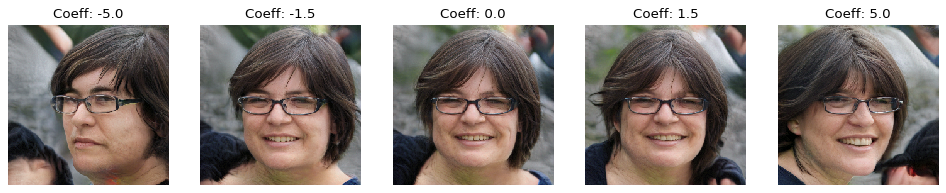

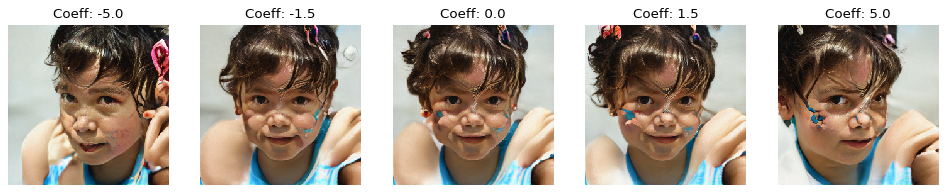

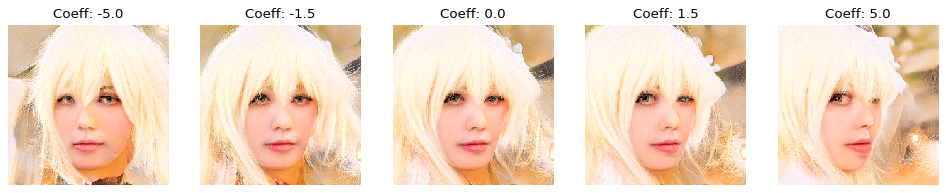

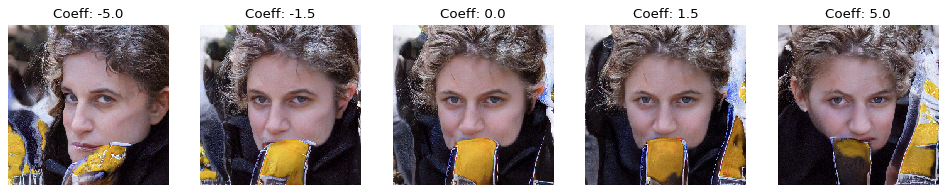

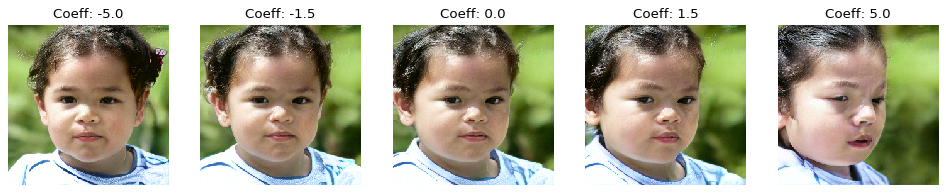

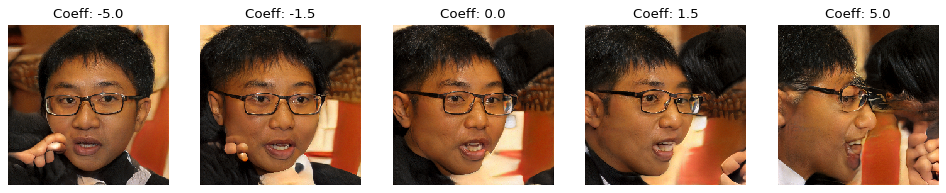

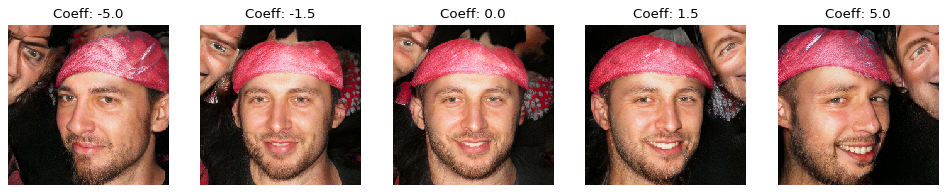

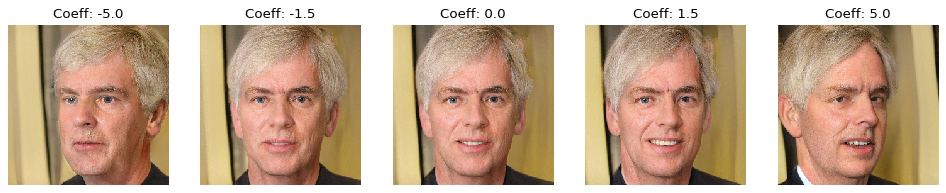

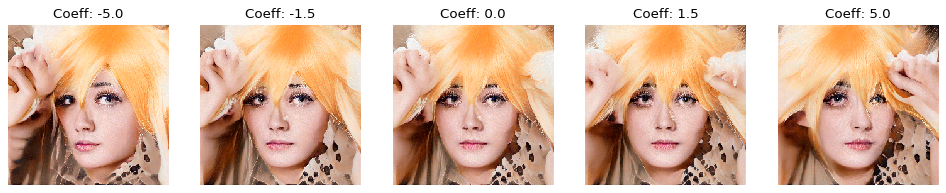

In [13]:
for i in range(10):
    move_and_show(X_data.reshape((-1, 18, 512))[i], yaw_direction, [-5, -1.5, 0, 1.5, 5])

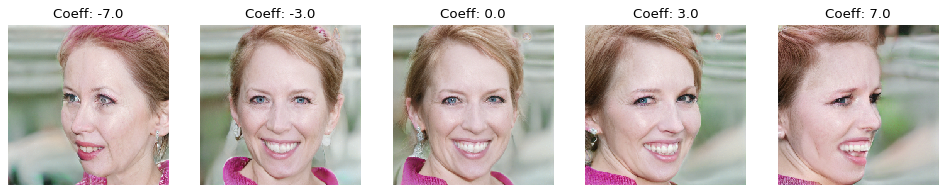

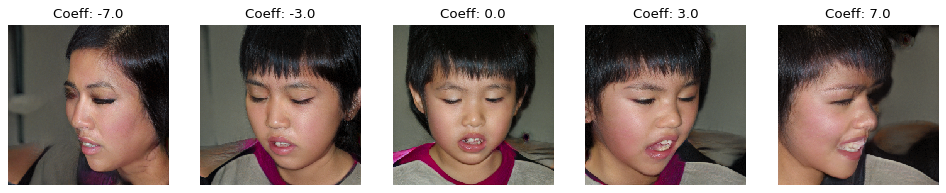

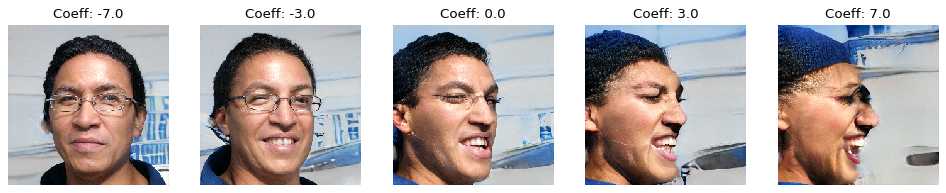

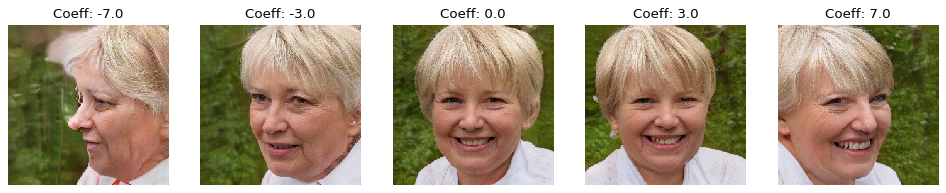

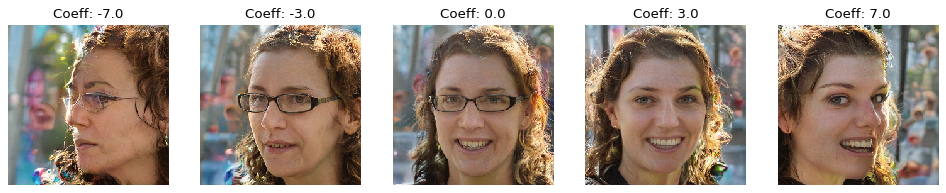

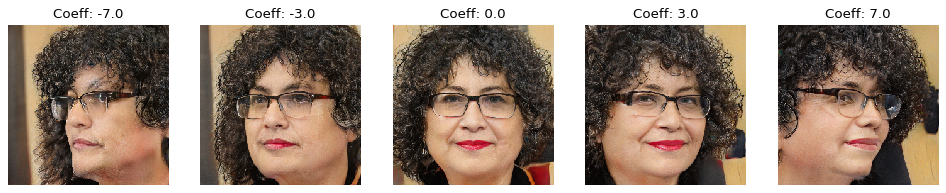

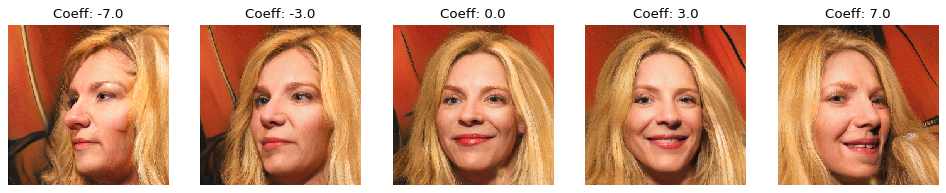

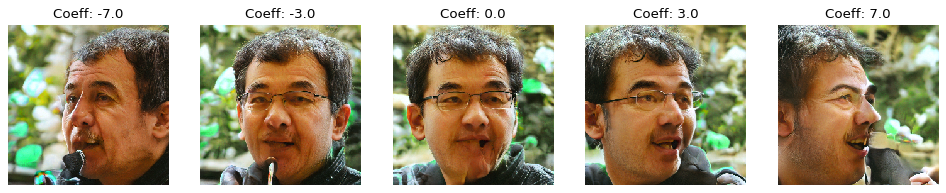

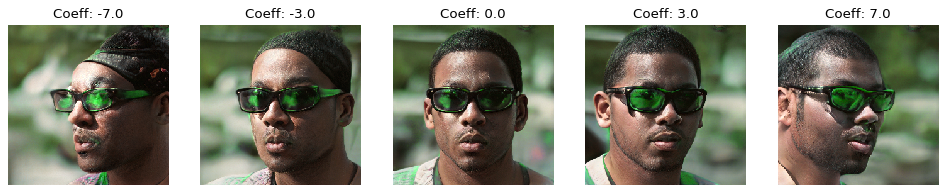

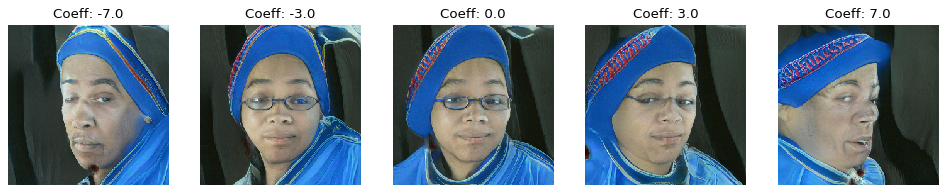

In [20]:
for i in range(20,30):
    move_and_show(X_data.reshape((-1, 18, 512))[i], yaw_direction, [-7,-3,0,3,7])

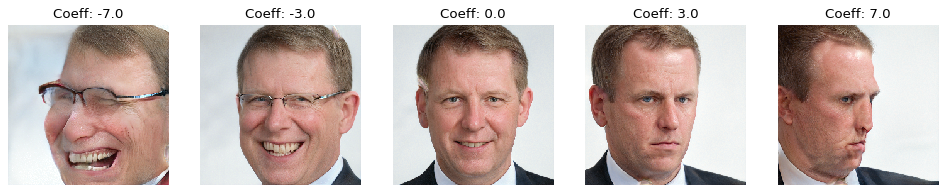

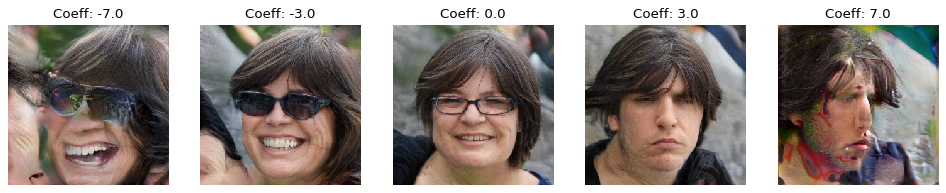

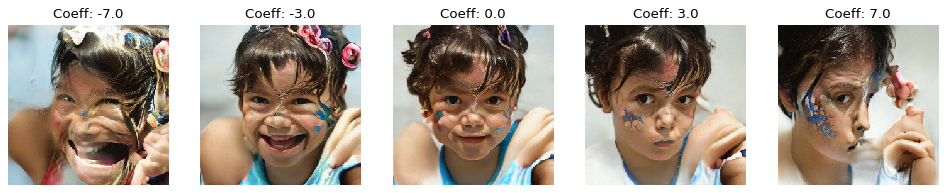

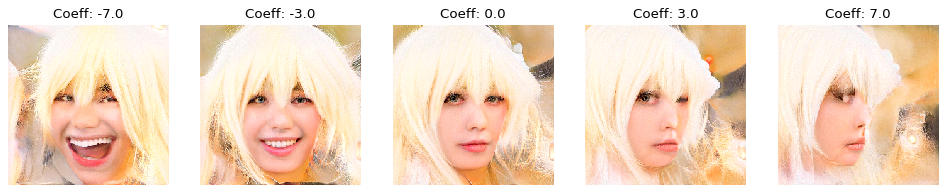

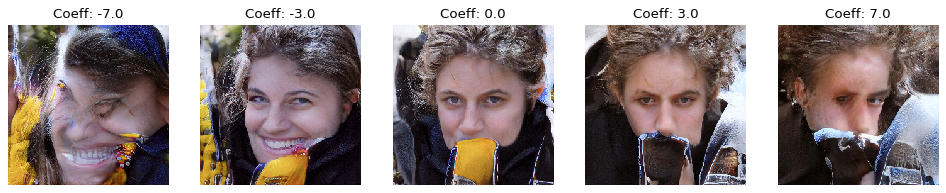

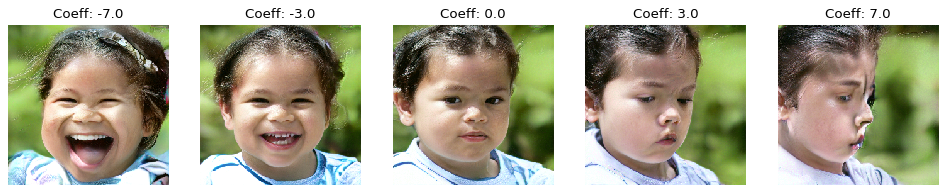

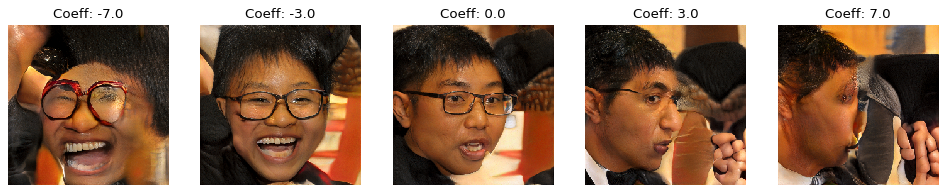

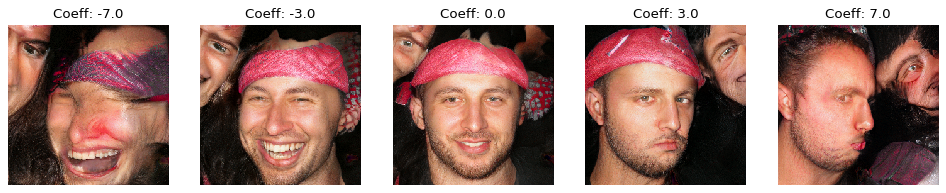

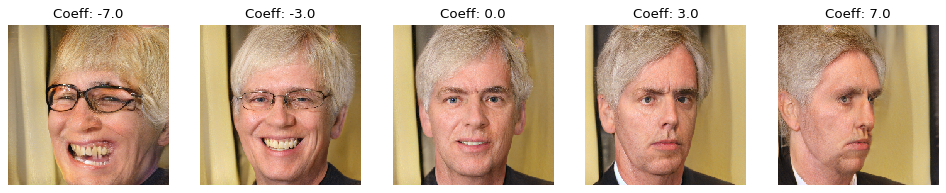

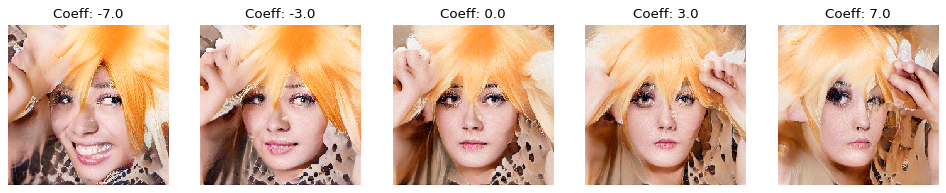

In [27]:
for i in range(0,10):
    move_and_show(X_data.reshape((-1, 18, 512))[i], muteSmile_direction, [-7,-3,0,3,7])

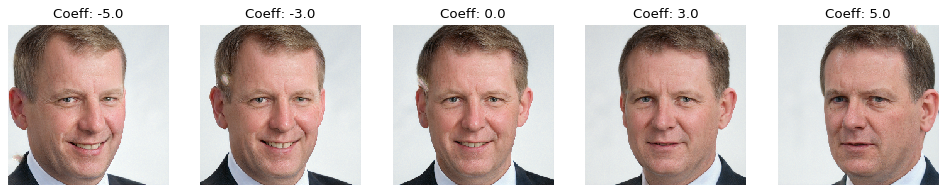

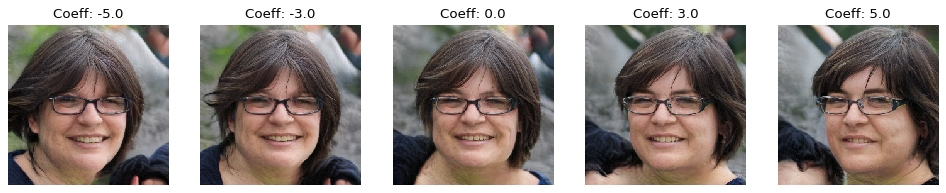

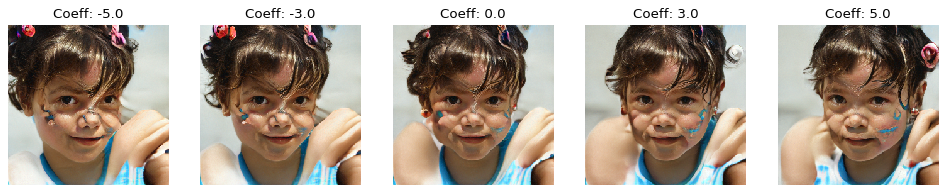

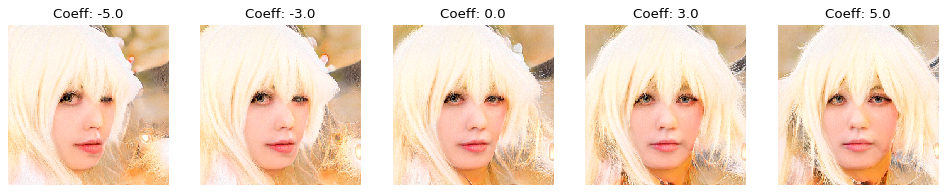

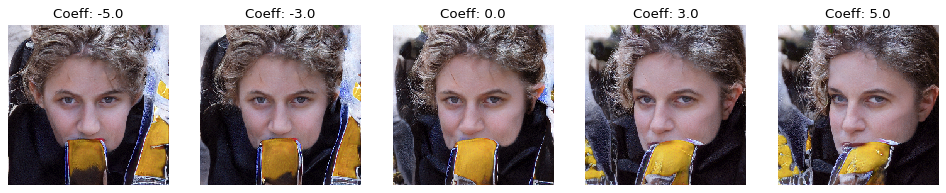

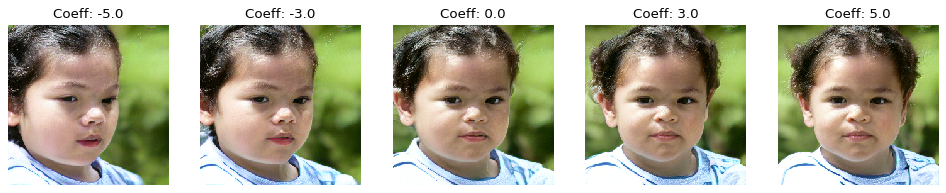

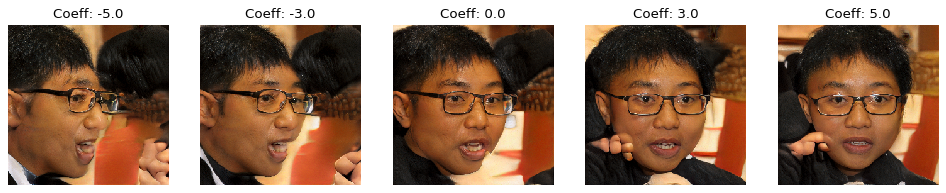

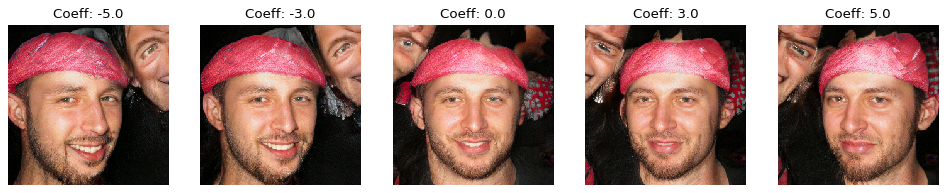

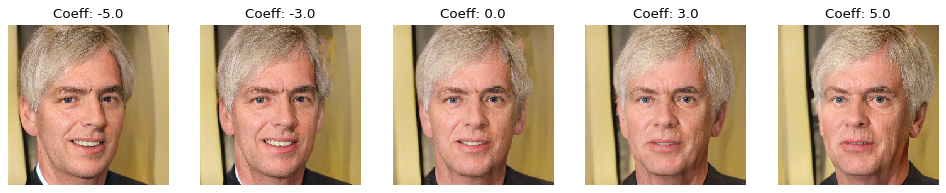

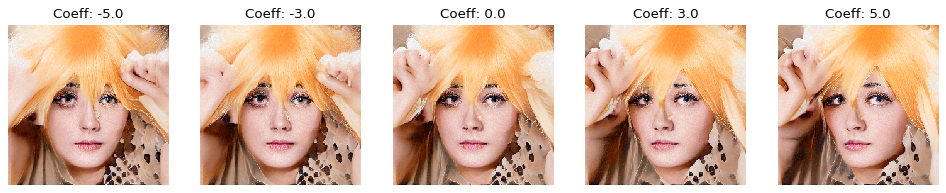

In [35]:
for i in range(0,10):
    move_and_show(X_data.reshape((-1, 18, 512))[i], roll_direction, [-5,-3,0,3,5])

In [44]:
from PIL import Image
target_dir = '../facial-data/views_img'
def move_and_show_and_save(latent_vector, direction, coeffs, seq: int):
    fig,ax = plt.subplots(1, len(coeffs), figsize=(15, 10), dpi=80)
    for i, coeff in enumerate(coeffs):
        new_latent_vector = latent_vector.copy()
        new_latent_vector[:8] = (latent_vector + coeff*direction)[:8]
        
        img = generate_image(new_latent_vector)
        
        ax[i].imshow(img)
        
        img.save('{}/{}st_face_{}_{}.png'.format(target_dir, seq, i, coeff))
        ax[i].set_title('Coeff: %0.1f' % coeff)
    [x.axis('off') for x in ax]
    plt.show()

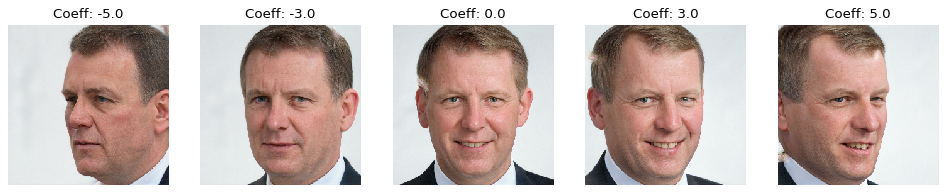

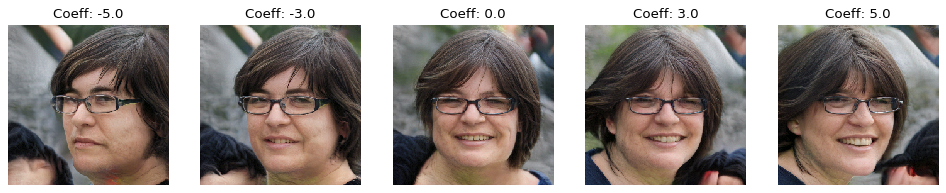

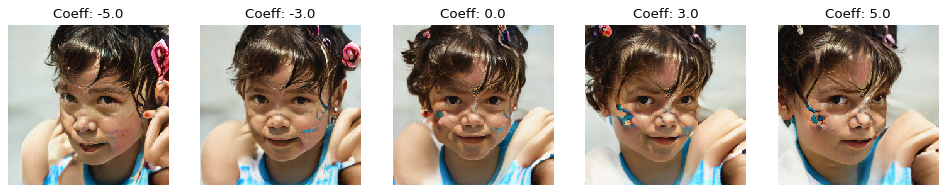

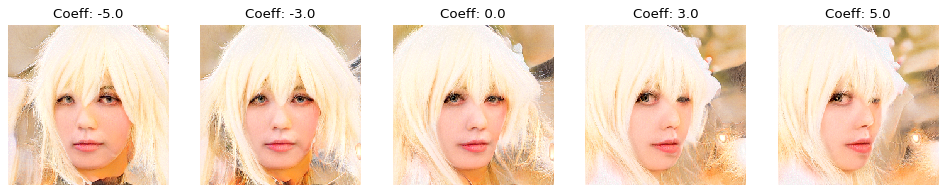

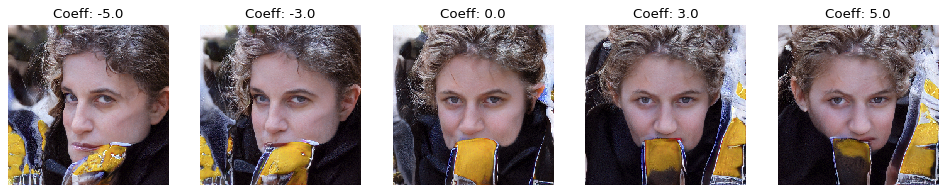

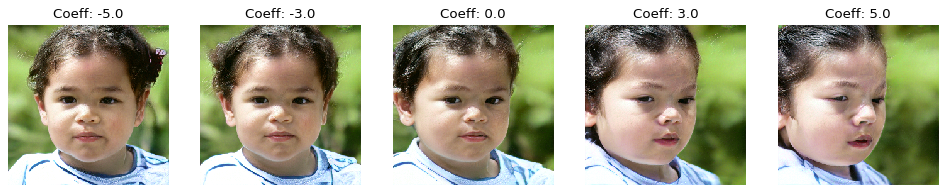

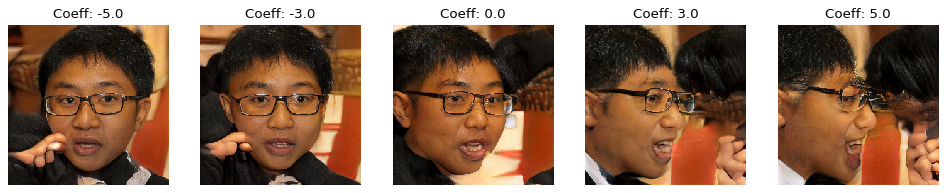

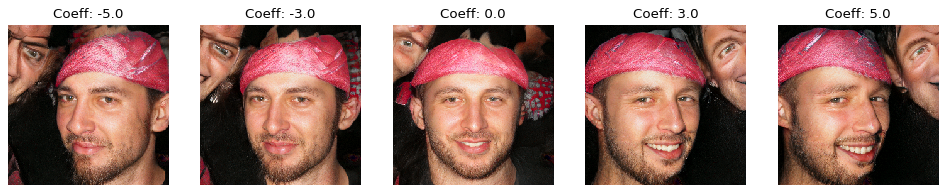

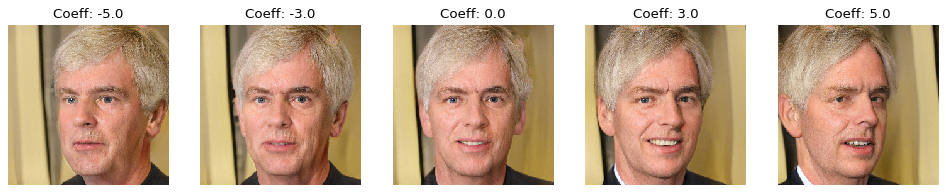

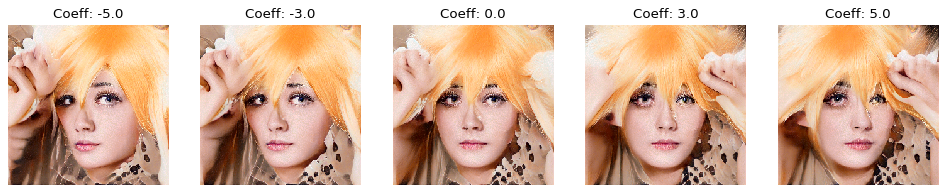

In [45]:
for i in range(0,10):
    move_and_show_and_save(X_data.reshape((-1, 18, 512))[i], yaw_direction, [-5,-3,0,3,5], i)